# Заданий №1

Требуется реализовать базовые методы планирования эксперемента: методом наименьших квадратов и метод для решения СЛАУ

Для решения этой задачи мы будем восстанавливать уравнение плоскости по точкам в трёхмерном пространстве. Уравнение задаётся формулой:

</br>
$$ax + by + c = z$$
</br>

где $a$, $b$, $c$ - коэф-енты, в свою очередь $x$, $y$, $z$ - параметры функции

Требуется найти $a$, $b$, $c$ по набору из знгаченией $x$, $y$, $z$. Для этого воспользуемся методом наименьших квадратов, составив уравнение, для вычисления искомых коэ-фов. Уравнение полученное с помощью метода наименьших квадратов:

</br>
$$
\left(\begin{array}{ccc}
\sum x^2 & \sum x * y & \sum x \\
\sum x * y & \sum y^2 & \sum y \\
\sum x & \sum y & \sum 1
\end{array}\right)\left(\begin{array}{l}
a \\
b \\
c
\end{array}\right)=\left(\begin{array}{l}
\sum x * z \\
\sum y * z \\
\sum z
\end{array}\right)
$$
</br>

Для решения СЛАУ будем использовать встроенные способы вычисления с помощью PyTorch

В результате работы программы мы получим коэффициенты $a$, $b$, $c$

*P.s. вместо torch можно использовать NumPy*

In [6]:
import torch

In [7]:
x_coef = 2.3
y_coef = 4.4
z_coef = -3.2

# Создание матрицы (матрица задаётся рандомно, чтобы избежать сингулярности)
M = torch.rand((4, 3), dtype=torch.float64)
M[:, 2] = x_coef * M[:, 0] + y_coef * M[:, 1] + z_coef

# Метод наименьших квадратов
x = torch.sum(M[:, 0])
y = torch.sum(M[:, 1])
z = torch.sum(M[:, 2])
xx = torch.sum(M[:, 0] * M[:, 0])
yy = torch.sum(M[:, 1] * M[:, 1])
xy = torch.sum(M[:, 0] * M[:, 1])
xz = torch.sum(M[:, 0] * M[:, 2])
yz = torch.sum(M[:, 1] * M[:, 2])

# Матрица коэффициентов и вектор правых частей
a = torch.tensor([[xx, xy, x], [xy, yy, y], [x, y, 4]])
b = torch.tensor([xz, yz, z])

# Решение СЛАУ
result = torch.linalg.solve(a, b)

print(f"a = {result[0].item()}, b = {result[1].item()}, c = {result[2].item()}")

a = 2.3000000000000034, b = 4.400000000000003, c = -3.200000000000004


# Заданий №2

Программно реализовать метод планирования экстремального эксперимента, используя ранее полученные результаты

Перед нами, как и в прошлый раз, стоит задача нахождения коэф-тов уравнения плоскости: $a$, $b$, $c$. Но также теперь нам нужно найти экстремум функции (в нашем случае минимум). Для этого мы будем использовать уравнение заданное формулой:

</br>
$$ax^{2} + by^{2} + c = z$$
</br>

где $a$, $b$, $c$ - коэф-енты, в свою очередь $x$, $y$, $z$ - параметры функции

Для поиска экстремума будет использован генетический алгоритм. Параметры для генетического алгоритма будут подобраны вручную. Хромосома будет состоять из двух генов, репрезентующие собой x и y. В нашем алгоритме будет использоваться этапы как скрещивания, так и мутации. Мутация будет представлять собой добавление к числу из хромосомы случайное значение в диапазоне $[-0.2, 0.2]$

Начальные значения x и y для поиска экстреммума мы будем брать случайным образом. Для $x$: $[-10, 10]$, а для $y$: $[-10, 10]$

*P.s. эта реализация алгоритма не учитывает те случаи, когда x может быть только положительным числом*

In [1]:
!pip install pygad

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.8/80.8 kB 2.2 MB/s eta 0:00:00


In [13]:
import numpy as np
import torch
import pygad
import random
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import sys

## Поиск коэффициентов уравнения

In [3]:
def f(k1, k2):
  global x_coef, y_coef, z_coef
  return x_coef ** 2 * k1 + y_coef ** 2 * k2 + z_coef

x_coef = 2.3
y_coef = 4.4
z_coef = -3.2

# Создание матрицы (матрица задаётся рандомно, чтобы избежать сингулярности)
M = torch.rand((4, 3), dtype=torch.float64)
M[:, 2] = f(M[:, 0], M[:, 1])

# Метод наименьших квадратов
x = torch.sum(M[:, 0])
y = torch.sum(M[:, 1])
z = torch.sum(M[:, 2])
xx = torch.sum(M[:, 0] * M[:, 0])
yy = torch.sum(M[:, 1] * M[:, 1])
xy = torch.sum(M[:, 0] * M[:, 1])
xz = torch.sum(M[:, 0] * M[:, 2])
yz = torch.sum(M[:, 1] * M[:, 2])

# Матрица коэффициентов и вектор правых частей
a = torch.tensor([[xx, xy, x], [xy, yy, y], [x, y, 4]])
b = torch.tensor([xz, yz, z])

# Решение СЛАУ (Метод инвертирования матрицы)
result = torch.linalg.solve(a, b)

# Получаем коэфициенты
a_coef = result[0]
b_coef = result[1]
c_coef = result[2]
print(f"a = {a_coef.item()}, b = {b_coef.item()}, c = {c_coef.item()}")

a = 5.289999999999961, b = 19.359999999999975, c = -3.199999999999962


## Поиск экстремума функции с помощью генетического алгоритма

Избавляемся от тензоров

In [4]:
a_coef = a_coef.item()
b_coef = b_coef.item()
c_coef = c_coef.item()

Алгоритм оптимизации для поиска экстремума функции

In [51]:
# Функция вычисления приспособленности особи
def f_recovered(ga_instance, solution, solution_idx):
  global a_coef, b_coef, c_coef
  result = a_coef * (solution[0]) ** 2 + b_coef * (solution[1]) ** 2 + c_coef
  return -result

# Функция мутации
def mutation_function(offspring, ga_instance):
  for idx in range(offspring.shape[0]):
    offspring[idx, 0] = offspring[idx, 0] + random.uniform(-0.2, 0.2)
    offspring[idx, 1] = offspring[idx, 1] + random.uniform(-0.2, 0.2)
  return offspring

# Вывод результата лучшей особи за каждйю эпоху
def on_gen(ga_instance):
    print("Generation : ", ga_instance.generations_completed)
    print("Fitness of the best solution :", ga_instance.best_solution()[1])

# Кол-во эпох
num_generations = 1000
# Кол-во особей, которое будет выбрано для скрещивания
num_parents_mating = 20
# Функция приспособленности
fitness_function = f_recovered
# Кол-во особей в каждой эпохе
sol_per_pop = 70
# Кол-во генов для каждой особи (хромосомы)
num_genes = 2
# Минимум и максимум для инициализации начальных значений
init_range_low = -5
init_range_high = 5
# Метод отбора родителей
parent_selection_type = "sss"
# Сколько отсавлять родительских особей для след. эпохи
keep_parents = 10
# Тип скрещивания
crossover_type = "uniform"
# Тип мутации
mutation_type = mutation_function
# Процент генов, который будет мутирован
mutation_percent_genes = 50

# Создаём генетический алгоритм
ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       crossover_type=crossover_type,
                       mutation_type=mutation_type,
                       mutation_percent_genes=mutation_percent_genes,
                       on_generation=on_gen,
                       gene_space=[{'low': -10, 'high': 10}, {'low': -10, 'high': 10}],
                       random_mutation_min_val=-1,
                       random_mutation_max_val=1)

# Запуск алгоритма
ga_instance.run()

Generation :  1
Fitness of the best solution : 3.1750310862364954
Generation :  2
Fitness of the best solution : 3.1750310862364954
Generation :  3
Fitness of the best solution : 3.193826088656182
Generation :  4
Fitness of the best solution : 3.193826088656182
Generation :  5
Fitness of the best solution : 3.193826088656182
Generation :  6
Fitness of the best solution : 3.196786227745981
Generation :  7
Fitness of the best solution : 3.196786227745981
Generation :  8
Fitness of the best solution : 3.1988716775902297
Generation :  9
Fitness of the best solution : 3.1988716775902297
Generation :  10
Fitness of the best solution : 3.1988716775902297
Generation :  11
Fitness of the best solution : 3.1988716775902297
Generation :  12
Fitness of the best solution : 3.199447061304671
Generation :  13
Fitness of the best solution : 3.199447061304671
Generation :  14
Fitness of the best solution : 3.199447061304671
Generation :  15
Fitness of the best solution : 3.199447061304671
Generation : 

Наилучший результат

In [52]:
ga_instance.best_solution()

(array([0.0009086 , 0.00017908]), 3.1999950119719296, 0)

In [53]:
res = ga_instance.best_solution()[0]
func_res = a_coef * res[0] ** 2 + b_coef * res[1] ** 2 + c_coef

print("Минимум функции в точке x: ", res[0], "Минимум функции в точке y: ", res[1], " Равен (z): ", func_res)

Минимум функции в точке x:  0.000908597927104085 Минимум функции в точке y:  0.00017907987830496908  Равен (z):  -3.1999950119719296


Визуализация изменения приспособленности

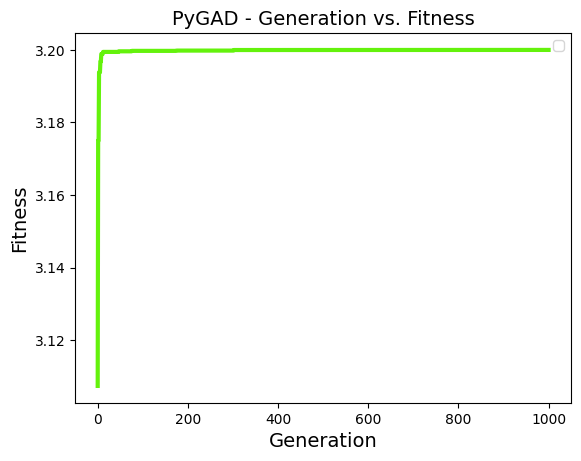

In [54]:
ga_instance.plot_fitness()
plt.show()

Визуализация функции для поиска минимума функции с помощью генетического алгоритма

In [55]:
x = np.linspace(-2, 2, 300)
y = np.linspace(-2, 2, 300)
X, Y = np.meshgrid(x, y)
Z = f_recovered(None, [X, Y], None)

fig = go.Figure(data=go.Surface(x=X, y=Y, z=Z))

fig.update_layout(
    height=800)
fig.show()

Действительная функция, которую мы анализировали

In [20]:
def f_recovered_true(x, y):
  global a_coef, b_coef, c_coef
  return a_coef * x ** 2 + b_coef * y ** 2 + c_coef

x = np.linspace(-2, 2, 300)
y = np.linspace(-2, 2, 300)
X, Y = np.meshgrid(x, y)
Z = f_recovered_true(X, Y)

fig = go.Figure(data=go.Surface(x=X, y=Y, z=Z))

fig.update_layout(
    height=800)
fig.show()

# Задание №3 часть 1

In [56]:
import numpy as np

import pygad

import torch
import torch.nn as nn
import torch.optim as optim

import plotly.express as px

from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

import sys

## Входные данные для модели, которые мы будем использовать

P.s. они всегда будут генерироваться одинаково при указанном random_state

In [57]:
x, y = make_blobs(n_samples=1000, random_state=0, n_features=3, centers=4, cluster_std=1.1, shuffle=False)

In [58]:
fig = px.scatter_3d(
  x=x[:, 0],
  y=x[:, 1],
  z=x[:, 2],
  color=y.astype(str),
  opacity=0.50
)

fig.update_layout(
    height=900)
fig.show()

## PyTorch нейронная сеть

### Построение модели объекта над которым будет ставится эксперимент

Входными данными в функцию эксперемента будут данные о кол-ве точек для генерации и размер скрытого слоя для обучения модели

In [59]:
# Входные данные для наших вычислений
n_samples = 900
hidden_size = 10

Создаём выборки для обучения и тестирования модели

In [60]:
x, y = make_blobs(n_samples=n_samples, random_state=0, n_features=3, centers=4, cluster_std=1.1)

In [61]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.35, random_state=42)

In [62]:
# Конвертация данных в тензоры PyTorch
x_train = torch.from_numpy(x_train).float()
y_train = torch.from_numpy(y_train).long()
x_test = torch.from_numpy(x_test).float()
y_test = torch.from_numpy(y_test).long()

Создаём класс модели

In [63]:
# Определение архитектуры нейронной сети
class NeuralNetwork(nn.Module):
  def __init__(self, input_size=3, hidden_size=5, num_classes=4):
    super(NeuralNetwork, self).__init__()
    # Веса между входным и скрытым слоем сети
    self.linear_1 = nn.Linear(input_size, hidden_size)
    # Веса между скрытым и выходныи слоем сети
    self.linear_2 = nn.Linear(hidden_size, num_classes)
    # Функция активации скрытого слоя
    self.leaky_relu = nn.LeakyReLU()

  def forward(self, x):
    x = self.linear_1(x)
    x = self.leaky_relu(x)
    x = self.linear_2(x)
    return x

Производим подготовку к обучению

In [64]:
# Параметры для обучения
learning_rate = 0.001
num_epochs = 1000

In [65]:
# Создание экземпляра модели
model = NeuralNetwork(hidden_size=hidden_size)

In [66]:
# Определение функции потерь и оптимизатора
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Производим обучение

In [67]:
# Обучение модели
for epoch in range(num_epochs):
  # Прямой проход (forward)
  outputs = model(x_train)
  loss = loss_function(outputs, y_train)

  # Обратное распространение ошибки (backward) и оптимизация весов
  loss.backward()
  optimizer.step()

  # Обнуление дереве для расчёта градиентов
  optimizer.zero_grad()

  # Вывод промежуточных результатов
  if (epoch+1) % 10 == 0:
    sys.stdout.write("\r" + "Epoch: " + str(epoch) + "  Loss: " + str(loss.item()))

Epoch: 999  Loss: 0.08058709651231766

Оценка качества предсказания модели на тестовых данных

In [69]:
# Оценка модели на тестовых данных
with torch.no_grad():
  # Расчитываем результат для тестовых входных данных
  outputs = model(x_test)
  # Из полученной матрицы коэфициентов отбираем максимальный для каждой строчки
  _, predicted = torch.max(outputs.data, 1)
  # Расчитываем коэф. правильности ответов
  accuracy = (predicted == y_test).sum().item() / y_test.size(0) * 100.
  print(f'Процент правильных ответов на тестовых данных: {accuracy}')

Процент правильных ответов на тестовых данных: 95.55555555555556


### Упаковка результатов в функцию

In [72]:
class NeuralNetwork(nn.Module):
  def __init__(self, input_size=3, hidden_size=5, num_classes=4):
    super(NeuralNetwork, self).__init__()
    # Веса между входным и скрытым слоем сети
    self.linear_1 = nn.Linear(input_size, hidden_size)
    # Веса между скрытым и выходныи слоем сети
    self.linear_2 = nn.Linear(hidden_size, num_classes)
    # Функция активации скрытого слоя
    self.leaky_relu = nn.LeakyReLU()

  def forward(self, x):
    x = self.linear_1(x)
    x = self.leaky_relu(x)
    x = self.linear_2(x)
    return x

def compare_effectivness(n_samples, hidden_size, print_learning_process=False,
                         print_result_on_test_data=False):
  # Создаём данные для обучения (они всегда одинаковые)
  x, y = make_blobs(n_samples=n_samples, random_state=0, n_features=3, centers=4, cluster_std=1.1)
  # Создаём выборки для обучения и тестирования модели
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.35, random_state=42)
  # Конвертация данных в тензоры PyTorch
  x_train = torch.from_numpy(x_train).float()
  y_train = torch.from_numpy(y_train).long()
  x_test = torch.from_numpy(x_test).float()
  y_test = torch.from_numpy(y_test).long()

  # Параметры для обучения
  learning_rate = 0.001
  num_epochs = 1000

  # Создание экземпляра модели
  model = NeuralNetwork(hidden_size=hidden_size)

  # Определение функции потерь и оптимизатора
  loss_function = nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

  # Обучение модели
  for epoch in range(num_epochs):
    # Прямой проход (forward)
    outputs = model(x_train)
    loss = loss_function(outputs, y_train)

    # Обратное распространение ошибки (backward) и оптимизация весов
    loss.backward()
    optimizer.step()

    # Обнуление дереве для расчёта градиентов
    optimizer.zero_grad()

    # Вывод промежуточных результатов
    if (epoch+1) % 10 == 0 and print_learning_process:
      sys.stdout.write("\r" + "Epoch: " + str(epoch) + "  Loss: " + str(loss.item()))

  # Оценка модели на тестовых данных
  with torch.no_grad():
    # Расчитываем результат для тестовых входных данных
    outputs = model(x_test)

    # Из полученной матрицы коэфициентов отбираем максимальный для каждой строчки
    _, predicted = torch.max(outputs.data, 1)

    # Расчитываем коэф. правильности ответов
    accuracy = (predicted == y_test).sum().item() / y_test.size(0) * 100.
    if print_result_on_test_data:
      print(f'\nПроцент правильных ответов на тестовых данных: {accuracy}')

  return accuracy

In [73]:
result = compare_effectivness(
  n_samples,
  hidden_size,
  print_learning_process=True,
  print_result_on_test_data=True
)

Epoch: 999  Loss: 0.06913293153047562
Процент правильных ответов на тестовых данных: 95.87301587301587


## Scikit-Learn SVM

### Построение модели объекта над которым будет ставится эксперимент

Входными данными в функцию эксперемента будут данные о кол-ве точек для генерации и кожф-нт регуляризации

In [74]:
# Входные данные для наших вычислений
n_samples = 900
c_koef = 1

Создаём выборки для обучения и тестирования модели

In [75]:
x, y = make_blobs(n_samples=n_samples, random_state=0, n_features=3, centers=4, cluster_std=1.1)

In [76]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.35, random_state=42)

Производим создание модели и её обучение

In [77]:
# Создание экземпляра модели
model = SVC(kernel='rbf', C=c_koef, random_state=0).fit(x_train, y_train)

Оценка качества предсказания модели на тестовых данных

In [78]:
y_pred = model.predict(x_test)

In [79]:
print(f'Процент правильных ответов на тестовых данных: {accuracy_score(y_test, y_pred) * 100.}')

Процент правильных ответов на тестовых данных: 96.82539682539682


### Упаковка результатов в функцию

In [80]:
def compare_effectivness(n_samples, c_koef, print_result_on_test_data=False):
  # Создаём данные для обучения (они всегда одинаковые)
  x, y = make_blobs(n_samples=n_samples, random_state=0, n_features=3, centers=4, cluster_std=1.1)
  # Создаём выборки для обучения и тестирования модели
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.35, random_state=42)

  # Создание экземпляра модели
  model = SVC(kernel='rbf', C=c_koef, random_state=0).fit(x_train, y_train)

  y_pred = model.predict(x_test)

  # Расчитываем коэф. правильности ответов
  accuracy = accuracy_score(y_test, y_pred) * 100.
  if print_result_on_test_data:
    print(f'Процент правильных ответов на тестовых данных: {accuracy}')

  return accuracy

In [81]:
result = compare_effectivness(
  n_samples,
  c_koef,
  print_result_on_test_data=True
)

Процент правильных ответов на тестовых данных: 96.82539682539682


# Задание №3 часть 2

In [2]:
!pip install pygad

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.8/80.8 kB 1.5 MB/s eta 0:00:00


In [3]:
import numpy as np

import pygad

import random

import torch
import torch.nn as nn
import torch.optim as optim

import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

import sys

## PyTorch нейронная сеть

Создаём функции для подбора оптимальных гиперпараметров с помощью генетического алгоритма

Здесь, в функции расчёта приспособленности, сразу-же внедрён цикл для обучения модели на одних и тех же гиперпараметрах несколько раз, чтобы получить среднее значение по результатам обучения моделей. Это было сделано, т.к. на перцептрон сильно влияет фактор случайности

In [19]:
LOOPS_FOR_MODEL = 10

class NeuralNetwork(nn.Module):
  def __init__(self, input_size=3, hidden_size=5, num_classes=4):
    super(NeuralNetwork, self).__init__()
    # Веса между входным и скрытым слоем сети
    self.linear_1 = nn.Linear(input_size, hidden_size)
    # Веса между скрытым и выходныи слоем сети
    self.linear_2 = nn.Linear(hidden_size, num_classes)
    # Функция активации скрытого слоя
    self.leaky_relu = nn.LeakyReLU()

  def forward(self, x):
    x = self.linear_1(x)
    x = self.leaky_relu(x)
    x = self.linear_2(x)
    return x

# Функция приспособляемости
def compare_effectivness(ga_instance, solution, solution_idx):
  global LOOPS_FOR_MODEL
  # Создаём данные для обучения (они всегда одинаковые)
  x, y = make_blobs(n_samples=int(round(solution[0], 0)), random_state=0, n_features=3, centers=4, cluster_std=1.1)
  # Создаём выборки для обучения и тестирования модели
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.35, random_state=42)
  # Конвертация данных в тензоры PyTorch
  x_train = torch.from_numpy(x_train).float()
  y_train = torch.from_numpy(y_train).long()
  x_test = torch.from_numpy(x_test).float()
  y_test = torch.from_numpy(y_test).long()

  # Параметры для обучения
  learning_rate = 0.001
  num_epochs = 500

  accuracy_mean = []

  # Цикл проверки одинаковых по параметрам моделей
  for attempt in range(LOOPS_FOR_MODEL):

    # Создание экземпляра модели
    model = NeuralNetwork(hidden_size=int(round(solution[1], 0)))

    # Определение функции потерь и оптимизатора
    loss_function = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    # Обучение модели
    for epoch in range(num_epochs):
      # Прямой проход (forward)
      outputs = model(x_train)
      loss = loss_function(outputs, y_train)

      # Обратное распространение ошибки (backward) и оптимизация весов
      loss.backward()
      optimizer.step()

      # Обнуление дереве для расчёта градиентов
      optimizer.zero_grad()

    # Оценка модели на тестовых данных
    with torch.no_grad():
      # Расчитываем результат для тестовых входных данных
      outputs = model(x_test)

      # Из полученной матрицы коэфициентов отбираем максимальный для каждой строчки
      _, predicted = torch.max(outputs.data, 1)

      # Расчитываем коэф. правильности ответов
      accuracy_mean += [(predicted == y_test).sum().item() / y_test.size(0) * 100.]

  return np.mean(accuracy_mean)

# Функция мутации
def mutation_function(offspring, ga_instance):
  for idx in range(offspring.shape[0]):
    offspring[idx, 0] = offspring[idx, 0] + random.randint(1, 50)
    offspring[idx, 1] = offspring[idx, 1] + random.randint(1, 5)

  return offspring

# Вывод результата лучшей особи за каждйю эпоху
def on_gen(ga_instance):
    print("Generation : ", ga_instance.generations_completed)
    print("Fitness of the best solution :", ga_instance.best_solution()[1])

# Кол-во эпох
num_generations = 10
# Кол-во особей, которое будет выбрано для скрещивания
num_parents_mating = 3
# Функция приспособленности
fitness_function = compare_effectivness
# Кол-во особей в каждой эпохе
sol_per_pop = 5
# Кол-во генов для каждой особи (хромосомы)
num_genes = 2
# Метод отбора родителей
parent_selection_type = "sss"
# Сколько отсавлять родительских особей для след. эпохи
keep_parents = 3
# Тип скрещивания
crossover_type = "uniform"
# Процент генов, который будет мутирован
mutation_percent_genes = 50

# Создаём генетический алгоритм
ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=[100, 5],
                       init_range_high=[1000, 50],
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       crossover_type=crossover_type,
                       mutation_type=mutation_function,
                       mutation_percent_genes=mutation_percent_genes,
                       on_generation=on_gen,
                       gene_space=[{'low': 100, 'high': 1000}, {'low': 5, 'high': 50}],
                       random_mutation_min_val=-1,
                       random_mutation_max_val=1)

# Запуск алгоритма
ga_instance.run()

Generation :  1
Fitness of the best solution : 98.39572192513369
Generation :  2
Fitness of the best solution : 98.3422459893048
Generation :  3
Fitness of the best solution : 98.3422459893048
Generation :  4
Fitness of the best solution : 98.3422459893048
Generation :  5
Fitness of the best solution : 98.3422459893048
Generation :  6
Fitness of the best solution : 98.3422459893048
Generation :  7
Fitness of the best solution : 98.3422459893048
Generation :  8
Fitness of the best solution : 98.3422459893048
Generation :  9
Fitness of the best solution : 98.3422459893048
Generation :  10
Fitness of the best solution : 98.3422459893048


In [89]:
res = ga_instance.best_solution()[0]

print("Размер выбокри: ", res[0], "Кол-во нейронов в скрытом слое: ", res[1])

Размер выбокри:  462.68641541830647 Кол-во нейронов в скрытом слое:  11.236552128259028


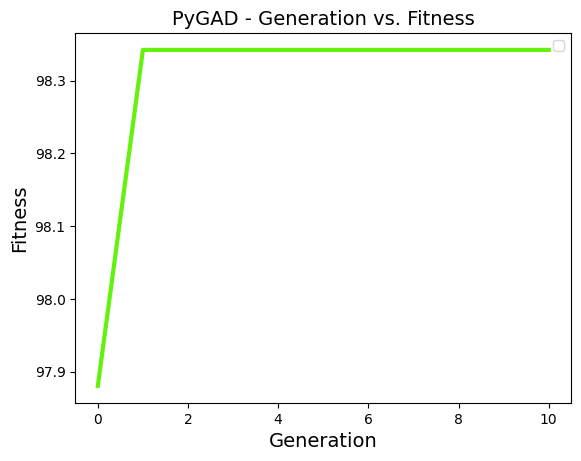

In [20]:
ga_instance.plot_fitness()
plt.show()

## Scikit-Learn SVM

Создаём функции для подбора оптимальных гиперпараметров с помощью генетического алгоритма

На работу SVM крайне слабо влияет фактор случайности. Его можно полностью убрать, если в SVC установить свой аргумент random_state

In [6]:
# Функция приспособляемости
def compare_effectivness(ga_instance, solution, solution_idx):
  # Создаём данные для обучения (они всегда одинаковые)
  x, y = make_blobs(n_samples=int(round(solution[0], 0)), random_state=0, n_features=3, centers=4, cluster_std=1.1)
  # Создаём выборки для обучения и тестирования модели
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.35, random_state=42)

  # Создание экземпляра модели
  model = SVC(kernel='rbf', C=solution[1], random_state=0).fit(x_train, y_train)

  y_pred = model.predict(x_test)

  # Расчитываем коэф. правильности ответов
  accuracy = accuracy_score(y_test, y_pred) * 100.

  return accuracy

# Функция мутации
def mutation_function(offspring, ga_instance):
  for idx in range(offspring.shape[0]):
    offspring[idx, 0] = offspring[idx, 0] + random.randint(1, 50)
    offspring[idx, 1] = offspring[idx, 1] + random.uniform(-0.2, 0.2)
    if offspring[idx, 1] <= 0:
      offspring[idx, 1] = 0.3

  return offspring

# Вывод результата лучшей особи за каждйю эпоху
def on_gen(ga_instance):
    print("Generation : ", ga_instance.generations_completed)
    print("Fitness of the best solution :", ga_instance.best_solution()[1])

# Кол-во эпох
num_generations = 100
# Кол-во особей, которое будет выбрано для скрещивания
num_parents_mating = 5
# Функция приспособленности
fitness_function = compare_effectivness
# Кол-во особей в каждой эпохе
sol_per_pop = 7
# Кол-во генов для каждой особи (хромосомы)
num_genes = 2
# Метод отбора родителей
parent_selection_type = "sss"
# Сколько отсавлять родительских особей для след. эпохи
keep_parents = 5
# Тип скрещивания
crossover_type = "uniform"
# Процент генов, который будет мутирован
mutation_percent_genes = 50


# Создаём генетический алгоритм
ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=[100, 1],
                       init_range_high=[1000, 10],
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       crossover_type=crossover_type,
                       mutation_type=mutation_function,
                       mutation_percent_genes=mutation_percent_genes,
                       on_generation=on_gen,
                       gene_space=[{'low': 100, 'high': 1000}, {'low': 0, 'high': 15}],
                       random_mutation_min_val=-1,
                       random_mutation_max_val=1)

# Запуск алгоритма
ga_instance.run()

Generation :  1
Fitness of the best solution : 99.23664122137404
Generation :  2
Fitness of the best solution : 99.32432432432432
Generation :  3
Fitness of the best solution : 99.32432432432432
Generation :  4
Fitness of the best solution : 99.32432432432432
Generation :  5
Fitness of the best solution : 99.32432432432432
Generation :  6
Fitness of the best solution : 99.32432432432432
Generation :  7
Fitness of the best solution : 99.38271604938271
Generation :  8
Fitness of the best solution : 99.38271604938271
Generation :  9
Fitness of the best solution : 100.0
Generation :  10
Fitness of the best solution : 100.0
Generation :  11
Fitness of the best solution : 100.0
Generation :  12
Fitness of the best solution : 100.0
Generation :  13
Fitness of the best solution : 100.0
Generation :  14
Fitness of the best solution : 100.0
Generation :  15
Fitness of the best solution : 100.0
Generation :  16
Fitness of the best solution : 100.0
Generation :  17
Fitness of the best solution : 1

In [7]:
res = ga_instance.best_solution()[0]

print("Размер выбокри: ", res[0], "Коэффициент регуляризации: ", res[1])

Размер выбокри:  463.10187226411506 Коэффициент регуляризации:  3.2273910921230864


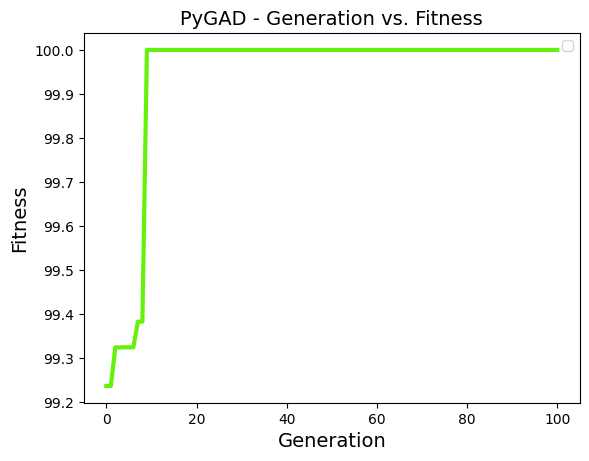

In [8]:
ga_instance.plot_fitness()
plt.show()

# Задание №4

Оценить адекватность аппроксимирующей модели поферхности отклика с помощью A/B тестирования (F-тест, T-тест)

Для данной задачи была взята только модель SVC. Прецептрон на PyTorch имел слишком большой разброс результатов обучения на одних и тех же гиперпаметрах. А время на прогонку гораздо больше, чем для SVC. По этому Прецептрон на PyTorch не оценивался здесь

Для проверки подобранных в прошлый раз оптимальных гиперпараметров для модели мы будем создавать данные случайным образом и будем анализировать как справилась модель. После проверки, с помощью перебора гиперпараметров мы создадим новую модель, которая покажет насколько были оптимальны гиперпараметры подобраны с помощью реализованной ранее метода оптимизации

Для проведения эксперемента возьмём ранее полученные гиперпараметры для модели и проведём 100 эксперементов

In [9]:
import numpy as np

import pandas as pd

import plotly.express as px

from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV

import scipy

import sys

Задание самых оптимальных гиперпараметров для SVC, полученных в прошлом задании

In [12]:
x_coef = int(round(463.10187226411506, 0))
y_coef = 3.2273910921230864

Создаё массив семян для генератора рандомных значений. Для проверки модели

In [13]:
rand_seeds = np.random.randint(1, 1000, (100))

Как говорилось ранее функция для аппроксимации гиперпарметров была изменена. В ней был создан подбор лучших параметров с помощью перебора

In [14]:
def compare_effectivness(n_samples, c_koef, random_state):
  # Расчёт результатов для модели с аппроксимированными гиперпараметрами

  # Создаём данные для обучения (они всегда одинаковые)
  x, y = make_blobs(n_samples=n_samples, random_state=random_state, n_features=3, centers=4, cluster_std=1.1)
  # Создаём выборки для обучения и тестирования модели
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.35, random_state=42)
  # Создание экземпляра модели и обучаем её
  model = SVC(kernel='rbf', C=c_koef).fit(x_train, y_train)
  y_pred = model.predict(x_test)
  # Расчитываем коэф. правильности ответов
  false_results_chosen = accuracy_score(y_test, y_pred) * 100.

  # Расчёт результатов с помощью алгоритма для автоматического подбора оптимальных гиперпараметров

  # Создаём сетку в прострастве которой мы будем искать С
  c_vars = np.arange(0.1, 5, 0.1)
  grid = {"C": c_vars}
  # Инициальзируем поиск и запускаем его
  cv_searcher = RandomizedSearchCV(SVC(kernel='rbf'), grid)
  cv_searcher.fit(x_train, y_train)
  # Отбираем лучший парамтер C
  c_best = cv_searcher.best_params_['C']
  # Создание экземпляра модели и обучаем её
  model = SVC(kernel='linear', C=c_best).fit(x_train, y_train)
  y_pred = model.predict(x_test)
  # Расчитываем коэф. правильности ответов
  false_results_cv = accuracy_score(y_test, y_pred) * 100.

  return [false_results_chosen, false_results_cv]

In [15]:
results = []

for i in range(100):
  results += [compare_effectivness(x_coef, y_coef, rand_seeds[i])]

results = pd.DataFrame(results, columns=["Аппроксимированный гипперпарамтеры", "Подобранные гипперпараметры"])
results

,Аппроксимированный гипперпарамтеры,Подобранные гипперпараметры
0,100.000000,100.000000
1,98.773006,99.386503
2,100.000000,100.000000
3,80.368098,80.368098
4,98.773006,99.386503
...,...,...
95,100.000000,100.000000
96,100.000000,100.000000
97,100.000000,100.000000
98,100.000000,100.000000


Производим тестирование

F-тест проверяет одинаковы ли дисперсии двух выборок. Нулевой гипотезой будет то, что дисперсии двух выборок одинаковы. Альтернативной гипотезой будет то, что дисперсия двух выборок не одинакова

$$H_{0}: σ_{1} = σ_{2} \tag{дисперсия выборок одинаковая}$$

$$H_{1}: σ_{1} ≠ σ_{2} \tag{дисперсия выборок разная}$$

In [16]:
def f_test(x, y):
  #calculate F test statistic
  f = np.var(x, ddof=1) / np.var(y, ddof=1)
  #define degrees of freedom numerator
  dfn = x.size-1
  #define degrees of freedom denominator
  dfd = y.size-1
  #find p-value of F test statistic
  p = 1 - scipy.stats.f.cdf(f, dfn, dfd)
  return f, p

f_test(results.iloc[:, 0].values, results.iloc[:, 1].values)

(1.0973433268570996, 0.32244082888768677)

В результате получим, что P-value > 0.05. По этому мы не можем отменить нулевую гипотезу (P-value - это второе значение)

T-тест проверяет одинаковы ли средние значения двух выборок. Нулевой гипотезой будет то, что средние значения двух выборок одинаковы. Альтернативной гипотезой будет то, что средние значения двух выборок не одинакова

$$H_{0}: \overline{x_{1}} = \overline{x_{2}} \tag{среднее значение выборок одинаковое}$$

$$H_{1}: \overline{x_{1}} ≠ \overline{x_{2}} \tag{среднее значение выборок разное}$$

In [17]:
scipy.stats.ttest_ind(a=results.iloc[:, 0].values, b=results.iloc[:, 1].values, equal_var=True)

TtestResult(statistic=-0.18415774383558658, pvalue=0.8540781780349262, df=198.0)

В результате получим, что P-value > 0.05. По этому мы не можем отменить нулевую гипотезу